# Attention Generative Adversarial Network (AttnGAN)

## Generative Adversarial Network (GAN)

Generative adversarial networks (GAN) is a way to generate samples from random noise
$z \sim p_Z$. In this work, the authors pit a generative model $G$ against an
adversary classifier $D$ whose repelling objective is to recognize real from
fake samples. Both models $G$ and $D$ are trained simultaneously, in such a way
that $G$ learns to produce samples that are difficult to classify by $D$, while
$D$ incrementally adapts to changes in $G$. At the equilibrium, $G$ models a
distribution whose fake samples are recognized by $D$ only by chance. In other
words, assuming enough capacity in $D$, the distribution $p_{G(Z)}$ of fake
samples converges towards the distribution of real samples.

are concurrently trained so as to minimize the respective loss functions:

\begin{align}
    L(G) &= -\frac{1}{2}\mathbb{E}_{\hat{x_i} \sim p_G} [\log(1 - D_i \hat x_i] -\frac{1}{2}\mathbb{E}_{x,y \sim p_{X,Y}} [\log(D_i(G(\hat x, e)))] \\
    L(D) &= \mathbb{E}_{x,y \sim p_{X,Y}} [\log(D(G(x, y)))]
\end{align}

![title 2](gan.png)

## Related Works

### dcGAN
Deep convolutional GAN

![title 2](dcGAN.png)

### GAWWN
GAN What-Where

![title 2](GAWWN.png)

### stack GAN

![title 2](stackGANv1.png)

### stack GAN v2

![title 2](stackGANv2.png)

## AttnGAN: Fine-Grained Text to Image Generation with Attentional Generative Adversarial Networks

 The model consists of two novel components. The first component is an **attentional generative network**, in which an attention mechanism is developed for the generator to draw different sub-regions of the image by focusing on words that are most relevant to the sub-region being drawn .The other component in the AttnGAN is a **Deep Attentional Multimodal Similarity Model (DAMSM)**. With an attention mechanism, the DAMSM is able to compute the similarity between the generated image and the sentence using both the global sentence level information and the fine-grained word level information. Thus, the DAMSM provides an additional fine-grained image-text matching loss for training the generator.

![title 2](schema.png)

In [1]:
import os
import sys
import time
from PIL import Image 
import matplotlib.pyplot as plt
import numpy as np
folder = os.path.dirname('../')
sys.path.append(folder)
from codebase.utils.log import Log
from codebase.datasets import TextDataset, DataPreprocess
from codebase.utils.prepare import Preparation
from codebase.condGAN import condGAN
%matplotlib inline

ModuleNotFoundError: No module named 'torch'

In [ ]:
import io
import base64
from IPython.display import HTML

In [ ]:
%%HTML
<video width="640" height="480" controls>
  <source src="video.mp4" type="video/mp4">
</video>

In [2]:
# Preparing environment
prep = Preparation()
cfg = prep.set_config('cfg/eval_bird.yml')
prep.set_random_seed()
output_dir = prep.set_output_dir()
prep.set_cuda()

NameError: name 'Preparation' is not defined

In [79]:
# Init log
log = Log(output_dir)

# Get data loader
dataprep = DataPreprocess(log)
image_transform = dataprep.image_transform()
dataloader, dataset = dataprep.get_dataloader('test', image_transform, True)

# Define models and go to evaluate
model = condGAN(output_dir, dataloader, dataset.n_words, dataset.ixtoword, log)
start_t = time.time()

Transform: 256
Total filenames:  11788 001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg
Load filenames from: ../data/birds/train/filenames.pickle (8855)
Load filenames from: ../data/birds/test/filenames.pickle (2933)
Load from:  ../data/birds/captions.pickle
Dataset test: n_words=5450 emb_num=10
CUDA status: False
GPU ID: -1
Init condGAN ... 


In [80]:
import ipywidgets as widgets
widgets.Text(
    value='Hello World',
    placeholder='Type something',
    description='String:',
    disabled=False
)


widgets.Button(
    description='Click me',
    disabled=False,
    button_style='', # 'success', 'info', 'warning', 'danger' or ''
    tooltip='Click me',
    icon='check'
)



Button(description='Click me', icon='check', style=ButtonStyle(), tooltip='Click me')

In [92]:
# Make captions
sentences= ['a small red bird']
tries = 5
threshold = 0.05


In [93]:
# Make captions
data_dic = {}
captions, cap_lens = model.tokenize_sentences(sentences, dataset.wordtoix)
cap_array, cap_lens, sorted_indices = model.process_captions(captions, cap_lens, sort=False)
data_dic['generated'] = [cap_array, cap_lens, sorted_indices]

# Generate images from pre-extracted embeddings
images = model.generate_images(data_dic, tries, threshold)  # generate images for customized captions
end_t = time.time()
log.add('Total time for evaluation: {}'.format(end_t - start_t))

Load text encoder from: ../DAMSMencoders/birds/text_encoder200.pth
Number of nets G/D: 3
ok
OrderedDict([('ca_net.fc.weight', tensor([[ 0.0986,  0.0299,  0.1147,  ...,  0.0226, -0.0830, -0.0677],
        [ 0.0384,  0.2784,  0.0331,  ...,  0.0756, -0.2293,  0.1138],
        [ 0.0668,  0.1149, -0.1216,  ..., -0.0298, -0.1134,  0.0732],
        ...,
        [-0.2626,  0.0141, -0.0022,  ...,  0.0160, -0.0333, -0.0584],
        [ 0.2339,  0.0165, -0.1379,  ...,  0.0434, -0.0072,  0.1041],
        [-0.0529,  0.0236,  0.0371,  ...,  0.2549,  0.1426,  0.0132]])), ('ca_net.fc.bias', tensor([-0.0164, -0.1613, -0.0516,  0.0313, -0.0207, -0.0276,  0.0440,  0.0135,
         0.0579,  0.0377, -0.0034,  0.0298,  0.0727,  0.0578, -0.1030,  0.0202,
        -0.1124,  0.0201, -0.0824,  0.0079, -0.1076,  0.0561,  0.0376,  0.0179,
         0.0242,  0.0578,  0.0354,  0.0426, -0.0974,  0.0582, -0.0260,  0.0269,
         0.0565, -0.0030,  0.1003, -0.1119,  0.1462,  0.0258, -0.0903,  0.0164,
        -0.0205,  0

Load G from: ../models/birds/attn2o_netG_epoch_600.pth
Load D0 from: ../models/birds/netD0_epoch_600.pth
Load D1 from: ../models/birds/netD1_epoch_600.pth
Load D2 from: ../models/birds/netD2_epoch_600.pth
Total time for evaluation: 5226.724582433701


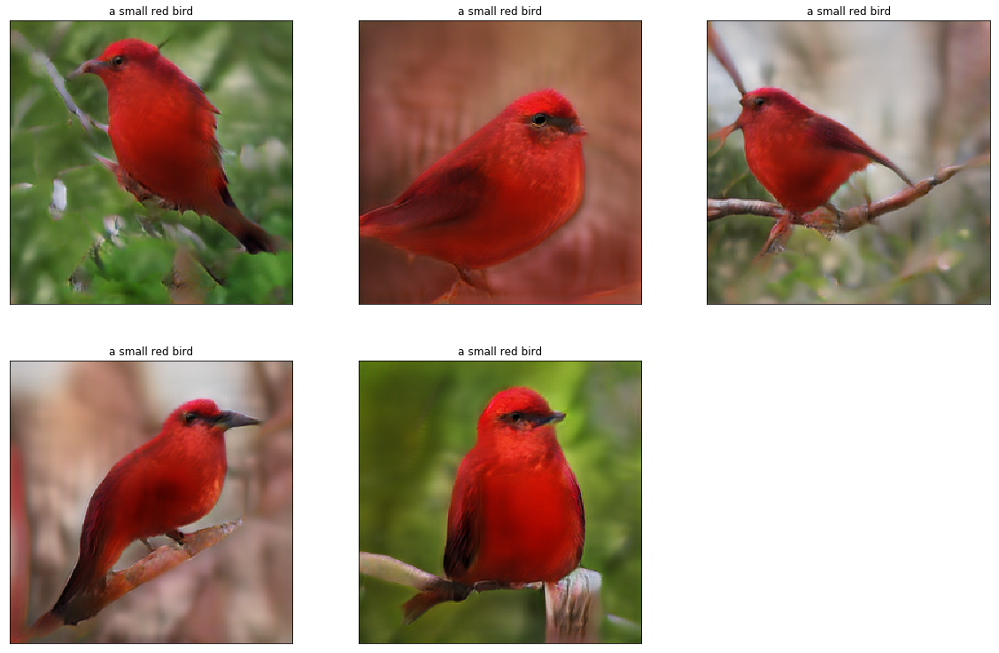

In [110]:
fig = plt.figure(figsize=(20,20))
for tr in range(tries):
    for i, path in enumerate(images[0][2][tr]):   
        img = Image.open(path)
        ax = fig.add_subplot(3,3, tr + i + 1, xticks=[], yticks=[], title=sentences[i])
        ax.imshow(np.asarray(img)) 

## Inception Score

Inception Score is a metric proposed in 2016 which evaluate the quality of an image

$$ IS(G) = exp(E_{x \sim p_g} D_{KL}(p(y|x) ||p(x))) $$

![title 2](InceptionScore.png)

## Proposed Arquitecture

We suggest add a srGAN in he final part of the diagram

![title 2](Propuesta.png)

which results are as follow:

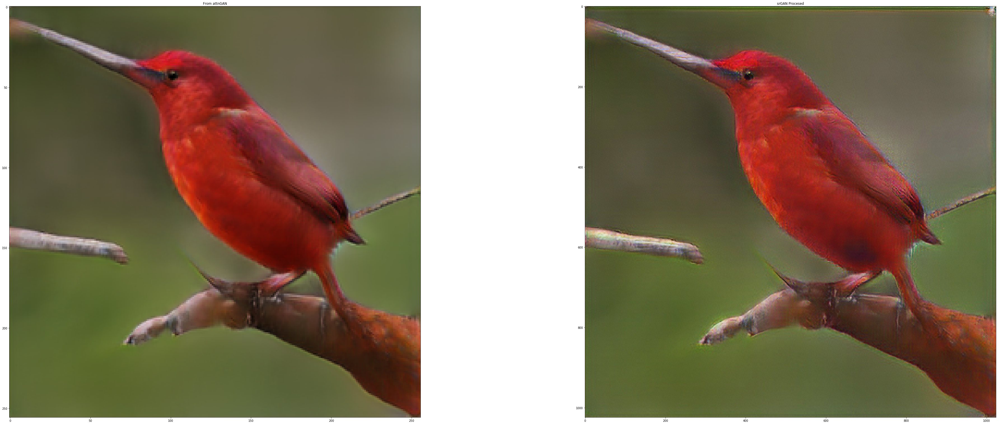

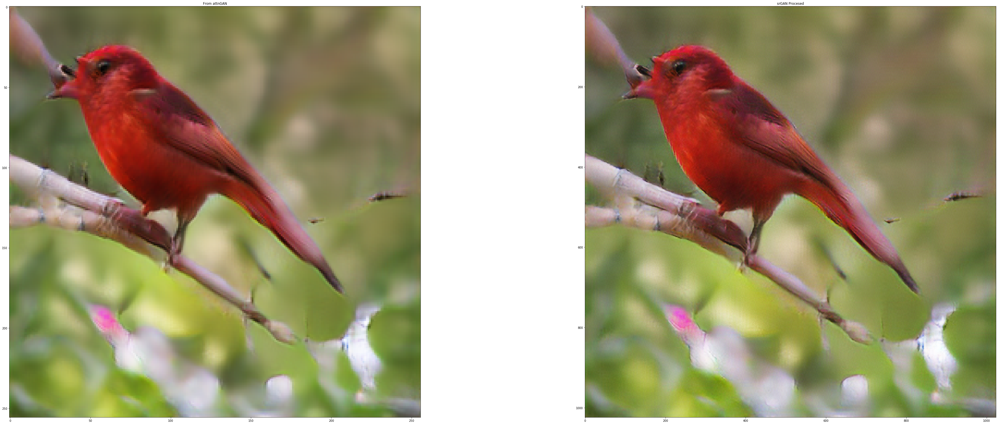

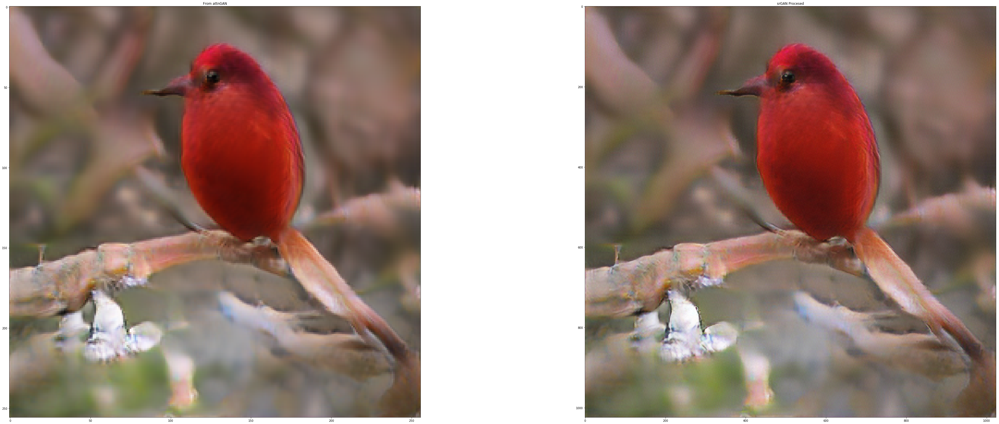

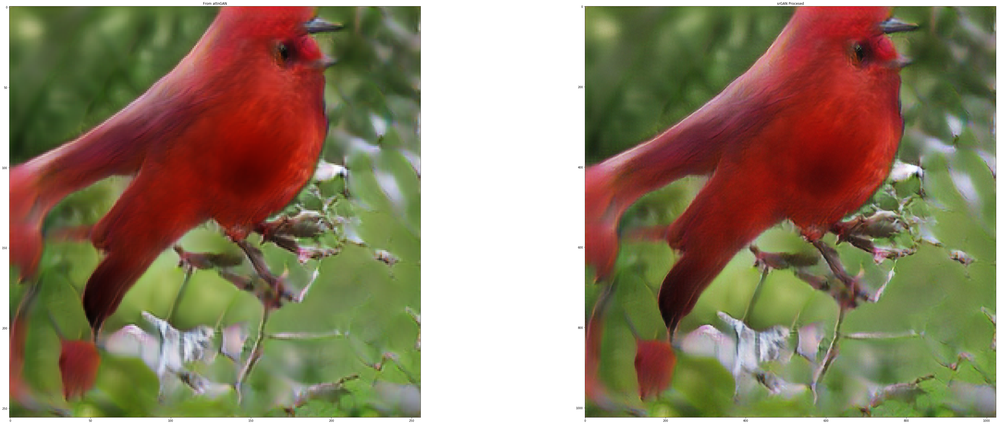

In [106]:
import matplotlib.pyplot as plt
%matplotlib inline
for i in range(4):
    im1 = plt.imread('results_demo/{0}/{1}.png'.format("A",str(i+1)))
    im2 = plt.imread('results_demo/{0}/{1}.jpg'.format("B",str(i+1)))

    #print('caption:', birds_samples[i].replace('_',' ') )
    figure = plt.figure(figsize=(100,100))
    plt.subplot(131).set_title('From attnGAN')
    plt.imshow(im1)
    plt.subplot(132).set_title('srGAN Procesed')
    plt.imshow(im2)
    plt.subplots_adjust(wspace=0.4)
    plt.show()